In [1]:
import nlp
import torch
import numpy as np
import scipy as sp
import io
import os
import random
import torch
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, DataLoader
from ml_things import plot_dict, plot_confusion_matrix, fix_text
from sklearn.metrics import classification_report, accuracy_score
from transformers import (set_seed,
                          TrainingArguments,
                          Trainer,
                          GPT2Config,
                          GPT2Tokenizer,
                          AdamW,
                          pipeline, 
                          get_linear_schedule_with_warmup,
                          GPT2ForSequenceClassification)

# Dictionary of labels and their id - this will be used to convert.
# String labels to number ids.
labels_ids = {'R': 0, 'D': 1}
id2label = {0: 'R', 1: 'D'}
# How many labels are we using in training.
# This is used to decide size of classification head.
n_labels = len(labels_ids)

# Look for gpu to use. Will use `cpu` by default if no gpu found.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# device = 'cpu'

# Get model configuration.
print('Loading configuraiton...')
# model_config = GPT2Config.from_pretrained(pretrained_model_name_or_path='model/gpt2-text-classifier-model-no-fc', num_labels=n_labels,  label2id=labels_ids)

# Get model's tokenizer.
print('Loading tokenizer...')
tokenizer = GPT2Tokenizer.from_pretrained(pretrained_model_name_or_path='gpt2')
# default to left padding
tokenizer.padding_side = "left"
# Define PAD Token = EOS Token = 50256
tokenizer.pad_token = tokenizer.eos_token


# Get the actual model.
print('Loading model...')
# model = GPT2ForSequenceClassification.from_pretrained(pretrained_model_name_or_path='model/gpt2-text-classifier-model-no-fc', config=model_config)
model = GPT2ForSequenceClassification.from_pretrained(pretrained_model_name_or_path='model/gpt2-text-classifier-model-no-fc', num_labels=n_labels, id2label=id2label, label2id=labels_ids)

# resize model embedding to match new tokenizer
model.resize_token_embeddings(len(tokenizer))

# fix model padding token id
model.config.pad_token_id = model.config.eos_token_id

# Load model to defined device.
model.to(device)
print('Model loaded to `%s`'%device)


Loading configuraiton...
Loading tokenizer...
Loading model...
Model loaded to `cpu`


In [2]:
from torch.utils.data import Dataset
import pandas as pd
import glob

files = ['../data/processed/hein-daily_106.csv', '../data/processed/hein-daily_107.csv',
'../data/processed/hein-daily_108.csv', '../data/processed/hein-daily_109.csv',
'../data/processed/hein-daily_110.csv', '../data/processed/hein-daily_111.csv',
'../data/processed/hein-daily_112.csv', '../data/processed/hein-daily_113.csv',
'../data/processed/hein-daily_114.csv']

def read_df():
    "Read csv into df"
    df = pd.DataFrame()
    for f in files:
        csv = pd.read_csv(f)
        df = df.append(csv)
    # df = pd.read_csv(path)
    shuffled_df = df.sample(frac=1).reset_index()
    # shuffled_df.drop(['level_0'], axis=1)
    return shuffled_df

def create_dataset(df):
    "Create df from csv"

    df_sliced = df[['speech','party']]
    df_sliced.columns = ['text', 'label']

    return df_sliced

def get_top_k_rows(df, k):
    "Get top k rows from df"
    df_R = df[df['party'] == 'R'].sample(n=int(k/2), random_state=123)
    df_D = df[df['party'] == 'D'].sample(n=k-int(k/2), random_state=123)
    df = pd.concat([df_R, df_D])
    df_k = df.sample(frac=1).reset_index()
    return df_k

def save_csv(df, path):
    "Save df to csv"
    df.to_csv(path, index=False)

def load_random_csv(path):
    "Load random csv from path"
    df = pd.read_csv(path)
    return df


In [ ]:
# To read all files in a directory
df = read_df()

In [3]:
# Uncomment to read from csv file created from random rows
# df = load_random_csv('random_5000.csv')

In [ ]:
# use k according to your choice to make random sample of speeches with equal number of R and D
k = 5000
df = get_top_k_rows(df, k)
save_csv(df, f'random_{k}.csv')

In [4]:
df = create_dataset(df)

In [5]:
from datasets import Dataset
arrow_dataset = Dataset.from_pandas(df)

In [15]:
arrow_dataset


Dataset({
    features: ['text', 'label'],
    num_rows: 5000
})

In [16]:
"""Explain Text Classification module"""
import shap
import pickle

from loguru import logger



class TextClassificationExplainer():
    """Explains Text Classification models using SHAP"""

    def __init__(
        self,
        # model_path: str = None,
        model: GPT2ForSequenceClassification = None,
        tokenizer: GPT2Tokenizer = None,
    ):
        self.model = model
        self.tokenizer = tokenizer
        labels = ['R', 'D']

        # build a pipeline object to do predictions
        self.pred = pipeline(
            "text-classification",
            model=model,
            tokenizer=tokenizer,
            device=0 if torch.cuda.is_available() else -1,
            max_length=128,
            padding=True,
            truncation=True,
            top_k=None,
        )
        logger.info("text classification pipeline loaded")

        self.explainer = shap.Explainer(self.pred)
        logger.info("text classification explainer loaded")

    def save_explainer_to_disk(self, filename_expl: str):
        """Save explainer to disk"""
        logger.info(f"Saving explainer to disk at {filename_expl}")
        # self.explainer.save(path)
        pickle.dump(self.explainer, open(filename_expl, 'wb'))
    
    def load_explainer_from_disk(self, filename_expl: str):
        """Load explainer from disk"""
        logger.info(f"Loading explainer from disk from {filename_expl}")
        return pickle.load(open(filename_expl, 'rb'))
    
    def save_shape_values_to_disk(self, filename_sv: str, shap_values):
        """Save shap values to disk"""
        logger.info(f"Saving shap values to disk at {filename_sv}")
        pickle.dump(shap_values, open(filename_sv, 'wb'))
    
    def load_shape_values_from_disk(self, filename_sv: str):
        """Load shap values from disk"""
        logger.info(f"Loading shap values from disk from {filename_sv}")
        return pickle.load(open(filename_sv, 'rb'))

    def get_shap_values(self, inputs):
        """
        Explains predictions of inputs using SHAP Explainer
        """
        logger.debug(f"explaining output for : {inputs}")
        return self.explainer(inputs)

    def get_predictions(self, inputs):
        """Return predictions from model"""

        predictions = self.pred(inputs)
        return predictions
    
    def get_plots(self,shap_values):
        "Plot graph of predictions"

        # shap_values.display_data = labels

        logger.debug(f"Plotting graph")
        return shap.plots.text(shap_values)

    def get_plots_specific_class(self, shap_values, class_name):
        "Return plot of specific class for specific text input"

        return shap.plots.text(shap_values[:, :, class_name])
    
    def get_plots_specific_input(self, shap_values, index_no, class_name):
        "Return plot of specific class for specific text input"

        return shap.plots.text(shap_values[index_no, :, class_name])

    def get_bar_plots_for_specific_input(self, shap_values, index_no, class_name):
        "Return bar plot for specific class"

        return shap.plots.bar(shap_values[index_no,:,class_name], max_display=20)

    def get_bar_plots_specific_class(self, shap_values, class_name):
        "Return bar plot for specific class"

        return shap.plots.bar(shap_values[:,:,class_name].mean(0), order=shap.Explanation.argsort, max_display=20)
        


Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display


In [17]:
explainer = TextClassificationExplainer(model=model, tokenizer=tokenizer)

2023-03-06 14:36:26.542 | INFO     | __main__:__init__:33 - text classification pipeline loaded
2023-03-06 14:36:26.575 | INFO     | __main__:__init__:36 - text classification explainer loaded


In [19]:
s_ind = 0
e_ind = len(arrow_dataset)

In [18]:
# Uncomment to read shap values from local disk
# shap_values = explainer.load_shape_values_from_disk('shap_values.sav')

2023-03-06 14:36:30.697 | INFO     | __main__:load_shape_values_from_disk:56 - Loading shap values from disk from shap_values.sav


In [ ]:
shap_values = explainer.get_shap_values(arrow_dataset['text'][s_ind:e_ind])

In [83]:
# run this cell to get top impactfulwords

word_importance = {}
for i in range(len(shap_values)):
    text_size = (shap_values[i].shape[0])
    if text_size<128:
        text = list(shap_values[i].data)
        values = list(shap_values[i].values)
        for j, word in enumerate(text):
            # word = text[j]
            word = word.strip()
            if word not in ['.', ',', '!', '?']:
                if word[0] == 'Ġ':
                    word = word[1:]
                if word not in word_importance:
                    word_importance[word] = 0
                word_importance[word] += abs(values[0][0])

# print(word_importance)
# sort the words by importance
sorted_words = sorted(word_importance.items(), key=lambda x: x[1], reverse=True)

# print the most impactful words
print("Most Impactful Words:")
for word, importance in sorted_words[:40]:
    print("{}: {}".format(word, importance))


`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/

Most Impactful Words:
the: 53.95545529968719
to: 31.201457739959523
I: 25.96767084233477
of: 19.951094029624578
and: 16.95018277870167
that: 14.075062533004614
a: 10.863484323256493
on: 10.00652673805564
in: 9.14676582816017
is: 8.536956178618645
from: 8.331732393204199
for: 8.08792227822113
be: 8.008402413157244
this: 6.738157502993814
have: 5.922281260971927
we: 5.669747082465265
ask: 5.303230522187465
Senator: 4.777969786336425
amendment: 4.712610855497144
time: 4.708993958233764
gentleman: 4.520612445407253
my: 4.433515727684992
consent: 4.365721549988969
unanimous: 4.301586725181243
it: 4.222389138381649
would: 4.198773148290549
as: 4.148974055373825
yield: 4.05608860884724
am: 3.740419203164475
will: 3.5705722419437826
Mr: 3.518486029400417
bill: 3.3748992770867736
not: 3.234349945339022
The: 3.146930837483937
are: 3.143361936511787
with: 3.0916011229102134
minutes: 2.940651239178032
Senate: 2.863110687768229
at: 2.821757937350191
Committee: 2.513208768759447


`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


In [85]:
# Uncomment to save list of impactful words to local disk
# import json
# with open('word_importance.txt', 'w') as convert_file:
#      convert_file.write(json.dumps(word_importance))

In [1]:
import json
with open('word_importance.txt') as f:
    data = f.read()
  
print("Data type before reconstruction : ", type(data))
      
# reconstructing the data as a dictionary
word_importance = json.loads(data)

Data type before reconstruction :  <class 'str'>


In [6]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Remove stop words from word_importance
stop_words = set(stopwords.words('english'))

words = []
values = []
for key, value in word_importance.items():
    if key.lower() not in stop_words:
        words.append(key)
        values.append(float(value))


In [4]:
# sort the words by importance
sorted_words = sorted(word_importance.items(), key=lambda x: x[1], reverse=True)
print("Most Impactful Words:")
for word, importance in sorted_words[:40]:
    print("{}: {}".format(word, importance))

Most Impactful Words:
the: 53.95545529968719
to: 31.201457739959523
I: 25.96767084233477
of: 19.951094029624578
and: 16.95018277870167
that: 14.075062533004614
a: 10.863484323256493
on: 10.00652673805564
in: 9.14676582816017
is: 8.536956178618645
from: 8.331732393204199
for: 8.08792227822113
be: 8.008402413157244
this: 6.738157502993814
have: 5.922281260971927
we: 5.669747082465265
ask: 5.303230522187465
Senator: 4.777969786336425
amendment: 4.712610855497144
time: 4.708993958233764
gentleman: 4.520612445407253
my: 4.433515727684992
consent: 4.365721549988969
unanimous: 4.301586725181243
it: 4.222389138381649
would: 4.198773148290549
as: 4.148974055373825
yield: 4.05608860884724
am: 3.740419203164475
will: 3.5705722419437826
Mr: 3.518486029400417
bill: 3.3748992770867736
not: 3.234349945339022
The: 3.146930837483937
are: 3.143361936511787
with: 3.0916011229102134
minutes: 2.940651239178032
Senate: 2.863110687768229
at: 2.821757937350191
Committee: 2.513208768759447


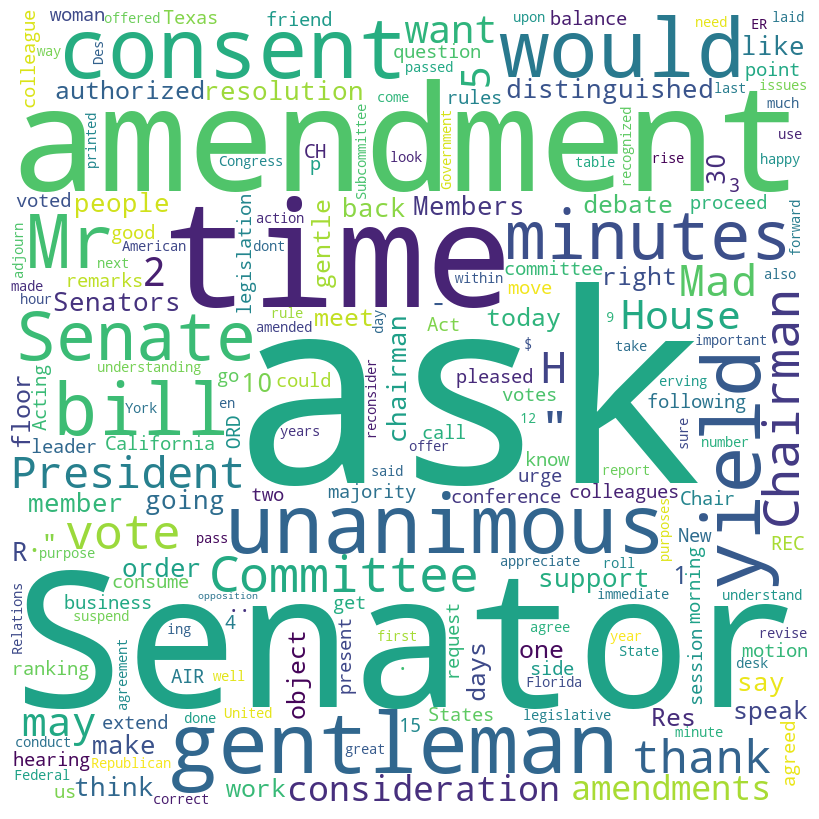

In [8]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(words, values):
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = None, 
                min_font_size = 10).generate_from_frequencies(dict(zip(words, values)))
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    # plt.show()
    plt.savefig('word_cloud_shap.png')

create_wordcloud(words, values)

In [ ]:
explainer.save_shape_values_to_disk('shap_values.sav', shap_values)

In [ ]:
model_predictions = explainer.get_predictions(arrow_dataset['text'][s_ind:e_ind])


In [ ]:
explainer.get_plots(shap_values)

In [ ]:
# refer to function get_plots_specific_input for more details
explainer.get_plots_specific_input(shap_values, 2, "R")

In [ ]:
# refer to function get_bar_plots_specific_class for bar plot of specific class
explainer.get_plots_specific_class(shap_values,12,"R")

In [ ]:
explainer.get_plots_specific_class(shap_values,12,"D")

In [ ]:
explainer.get_bar_plots_specific_class(shap_values, "D")

In [ ]:
explainer.get_bar_plots_specific_class(shap_values, "R")

[[{'label': 'R', 'score': 0.5385339260101318}, {'label': 'D', 'score': 0.46146610379219055}]]
We need a plan from the President. We need more certainty restored to these markets. Lets reject this Alice in Wonderland sort of leadership. Dont bring me problems. I say to my colleagues. Bring me solutions. One solution is the Cut. Cap, and Balance Act, and I commend it for your consideration.
R
----------------------
shap analysis
----------------------


`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/

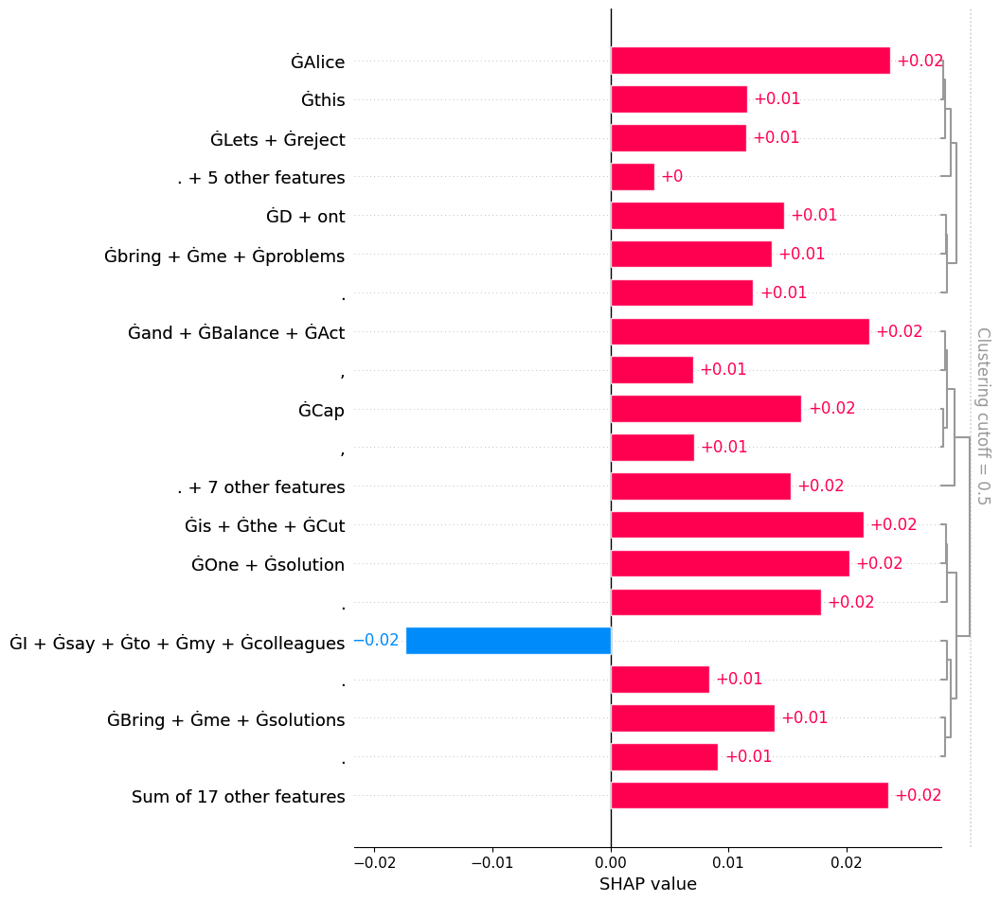

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/

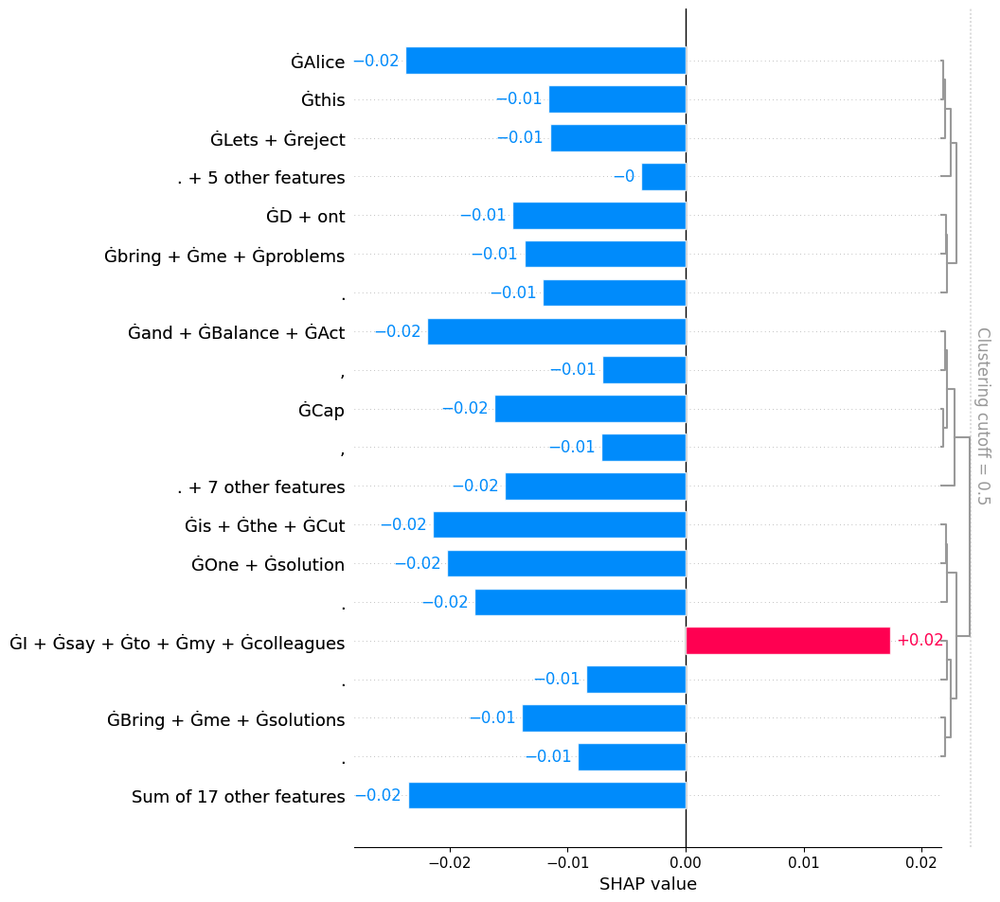

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/

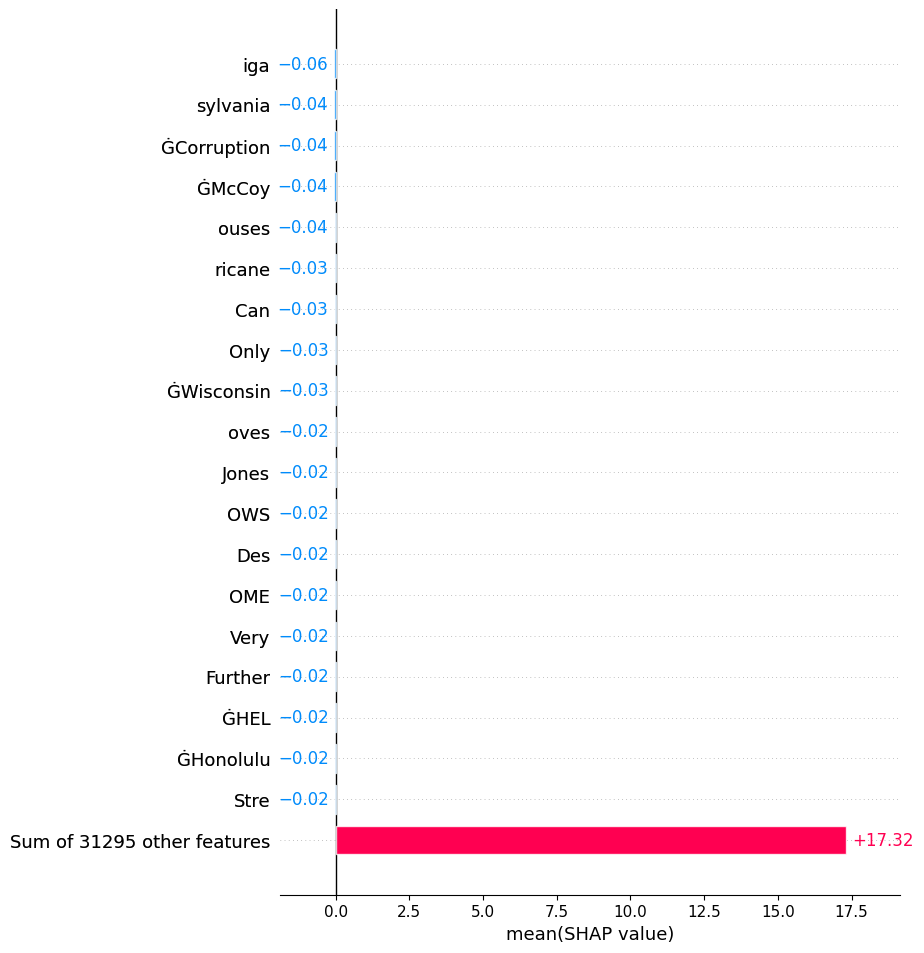

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/

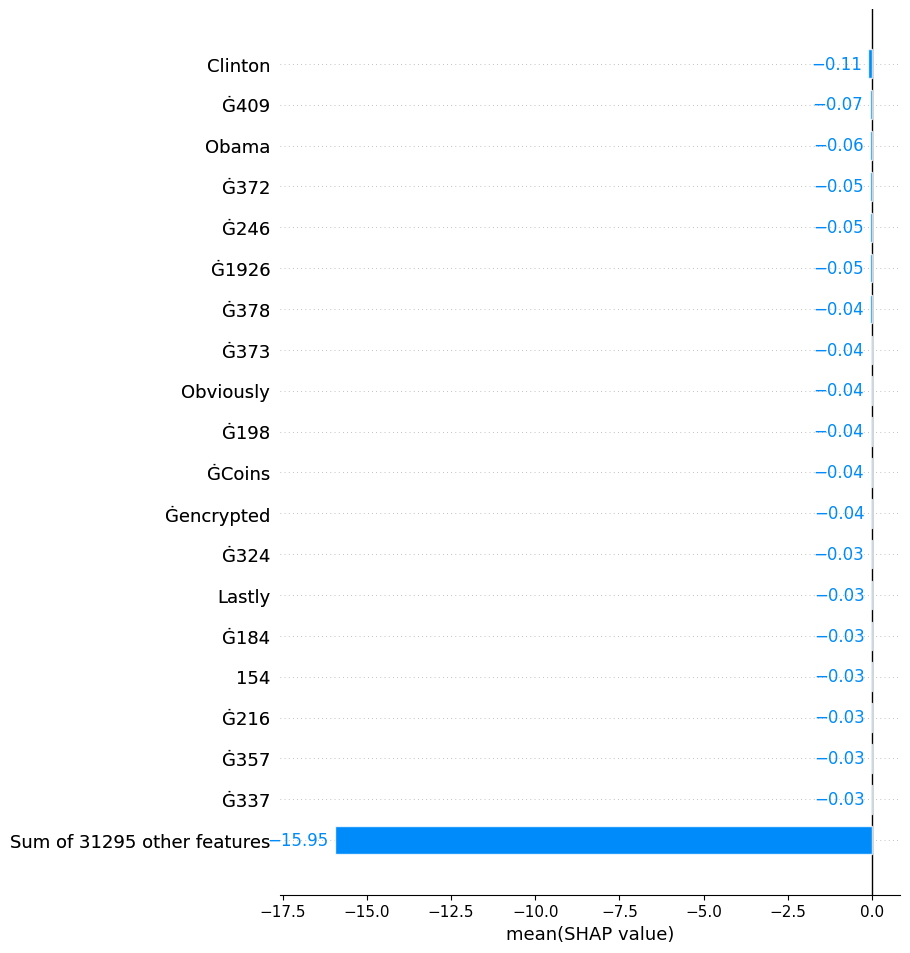

In [20]:
# use any value between 0 and len(arrow_dataset) to get detials of specific text input
idx = 2167
mp = explainer.get_predictions(arrow_dataset['text'][idx])
print(mp)
# print(model_predictions[idx])
print(arrow_dataset['text'][idx])
print(arrow_dataset['label'][idx])
print("----------------------")
print("shap analysis")
print("----------------------")
explainer.get_plots_specific_input(shap_values, idx, "R")
explainer.get_plots_specific_input(shap_values, idx, "D")
explainer.get_bar_plots_for_specific_input(shap_values, idx, "R")
explainer.get_bar_plots_for_specific_input(shap_values, idx, "D")
explainer.get_bar_plots_specific_class(shap_values, "R")
explainer.get_bar_plots_specific_class(shap_values, "D")

rough work

In [ ]:
df['len'] = df['text'].apply(lambda x: len(x.split()))

In [ ]:
df.sort_values(by=['len'], inplace=True)
df_new = df[df['len'] < 150]

In [ ]:
df_new.iloc[1110:1150]

In [ ]:
df.loc[655]['text']

In [ ]:
new_arrow_dataset = Dataset.from_pandas(df_new)

In [ ]:
word_importance = {}
for i, text in enumerate(arrow_dataset['text'][s_ind:e_ind]):
    # print(text)
    for j, word in enumerate(text.split()):
        if word not in word_importance:
            word_importance[word] = 0
        word_importance[word] += abs(shap_values[i][j].values[0])

# sort the words by importance
sorted_words = sorted(word_importance.items(), key=lambda x: x[1], reverse=True)

# print the most impactful words
print("Most Impactful Words:")
for word, importance in sorted_words[:20]:
    print("{}: {}".format(word, importance))

In [ ]:
s_ind = 0
e_ind = 1
word_importance = {}
# for i, text in enumerate(arrow_dataset['text'][s_ind:e_ind]):
#     print(shap_values[i].shape[0])
#     print(len(text.split()))
#     if len(text.split())<80 and (shap_values[i].shape[0] == len(text.split())):
#         for j, word in enumerate(text.split()):
#             if word not in word_importance:
#                 word_importance[word] = 0
#             word_importance[word] += abs(shap_values[i][j].values[0])

# # sort the words by importance
# sorted_words = sorted(word_importance.items(), key=lambda x: x[1], reverse=True)

# # print the most impactful words
# print("Most Impactful Words:")
# for word, importance in sorted_words[:20]:
#     print("{}: {}".format(word, importance))


for i in range(len(shap_values)):
    text_size = (shap_values[i].shape[0])
    if text_size<80:
        text = list(shap_values[i].data)
        values = list(shap_values[i].values)
        for j, word in enumerate(text):
            # word = text[j]
            word = word.strip()
            if word not in ['.', ',', '!', '?']:
                if word[0] == 'Ġ':
                    word = word[1:]
                if word not in word_importance:
                    word_importance[word] = 0
                word_importance[word] += abs(values[0][0])

# print(word_importance)
# sort the words by importance
sorted_words = sorted(word_importance.items(), key=lambda x: x[1], reverse=True)

# print the most impactful words
print("Most Impactful Words:")
for word, importance in sorted_words[:20]:
    print("{}: {}".format(word, importance))


Lime Explanation

In [11]:
from lime.lime_text import LimeTextExplainer

class LimeTextClassification:
    "Explain text classification using LIME"

    def __init__(self,model,tokenizer):
        self.model = model
        self.tokenizer = tokenizer

    def predictor(self, text):
        "Party prediction function, here logits in tensor so we dtach it to convert into numpy"
        inputs = self.tokenizer(text=text, return_tensors="pt", padding=True, truncation=True,  max_length=128).to(device)
        outputs = self.model(**inputs)
        logits = outputs.logits

        prob = torch.nn.functional.softmax(logits, dim=1).detach().numpy()
        return prob


In [13]:

class_names = {0: 'R', 1:'D'}
lime_text_classifier = LimeTextClassification(model,tokenizer)

LIME_explainer = LimeTextExplainer(class_names=['R','D'])

# idx = random.randint(0, len(arrow_dataset))
idx = 2167
text = arrow_dataset[idx]['text']
true_label = arrow_dataset[idx]['label']

LIME_exp = LIME_explainer.explain_instance(text, lime_text_classifier.predictor, num_features=10, num_samples=len(text.split()))

predicted_party = lime_text_classifier.predictor(text)
max_prob = predicted_party.max()
predicted_party = class_names[predicted_party.argmax().item()]

# print results
print('Document id: %d' % idx)
print('Speech text: ', text)
print('True party label: %s' % true_label)
print("------------------------------------------")
print('Probability of party =', max_prob.round(3))
print('Predicted party label: %s' % true_label)
print("------------------------------------------")
print()

LIME_exp.show_in_notebook(text=text)
# saving result in html
LIME_exp.save_to_file('lime_exp_{}.html'.format(idx))

Document id: 2167
Speech text:  We need a plan from the President. We need more certainty restored to these markets. Lets reject this Alice in Wonderland sort of leadership. Dont bring me problems. I say to my colleagues. Bring me solutions. One solution is the Cut. Cap, and Balance Act, and I commend it for your consideration.
True party label: R
------------------------------------------
Probability of party = 0.539
Predicted party label: R
------------------------------------------



C:\Users\Aman Varshney\AppData\Roaming\Python\Python39\site-packages\lime\explanation.py:194: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML
